## Project on predicting dog breed based on the image

In [101]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [102]:
# importing TensorFlow2

In [103]:
import tensorflow as tf
print("tf version:",tf.__version__)

tf version: 2.15.0


In [104]:
import tensorflow_hub as hub
print("tfHUB version:",hub.__version__)

tfHUB version: 0.16.1


In [105]:
print('GPU available' if tf.config.list_physical_devices("GPU") else "not available")

GPU available


# Getting our data ready

In [106]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [107]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [108]:
labels_csv['breed'].value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
komondor                 67
brabancon_griffon        67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

<Axes: xlabel='breed'>

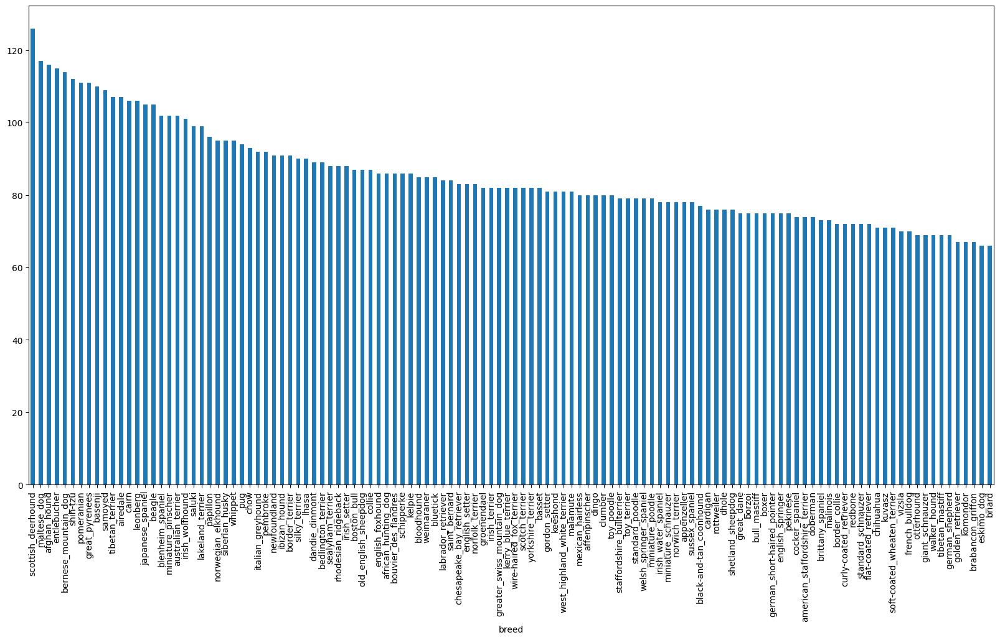

In [109]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [110]:
labels_csv['breed'].value_counts().median()

82.0

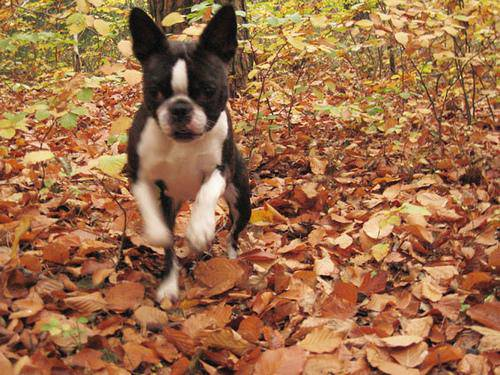

In [111]:
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

## Getting pathnames from image ids

In [112]:
# create pathnames from image ids

filenames = ["/content/drive/MyDrive/Dog Vision/train/"+fname+".jpg" for fname in labels_csv['id']]

filenames[:10]

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

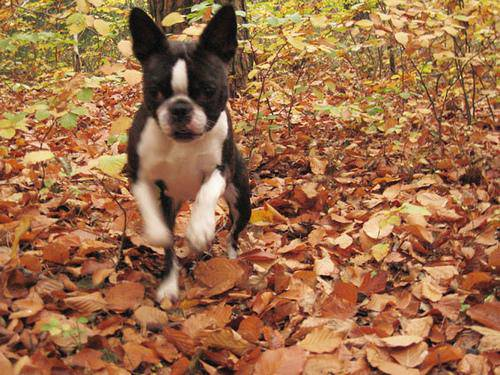

In [113]:
Image('/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

In [114]:
len(labels_csv['id'])==len(filenames)

True

In [115]:
import os
if len(os.listdir('/content/drive/MyDrive/Dog Vision/train/')) == len(filenames):
  print("number of files matches")
else:
  print('doesnt match')

number of files matches


In [116]:
# Cross checking the filenames

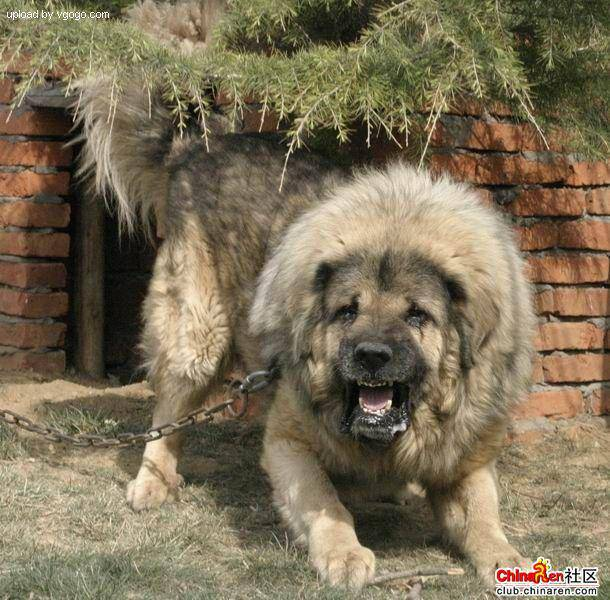

In [117]:
Image(filenames[9000])

In [118]:
labels_csv['id'][9000]

'e20e32bf114141e20a1af854ca4d0ecc'

In [119]:
labels_csv['breed'][9000]

'tibetan_mastiff'

# Converting Data into Numbers

In [120]:
import numpy as np
labels = labels_csv['breed']
labels = np.array(labels)

In [121]:
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [122]:
len(labels) == len(filenames)

True

In [123]:
len(labels)

10222

In [124]:
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [125]:
len(unique_breeds)

120

# Turning labels into Boolean values

In [126]:
boolean_labels = [label == unique_breeds for label in labels]

boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [127]:
len(boolean_labels)

10222

# Creating our own validation set

In [128]:
x = filenames
y = boolean_labels

We're going to use 1000 images and increase if needed

In [129]:
# Setting a value for the number of images going to be used
Num_Images = 1000 #@param {type:"slider",min:1000,max:10000,step:100}

In [130]:
# we are going to use traintestsplit for splitting the data into train and validation splits
from sklearn.model_selection import train_test_split

xtrain,xval,ytrain,yval = train_test_split(x[:Num_Images],y[:Num_Images],test_size=0.2,random_state=42)

In [131]:
len(xtrain), len(xval), len(ytrain), len(yval)

(800, 200, 800, 200)

In [132]:
xtrain[:5],ytrain[:5]

(['/content/drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

## Creating a function to turn images into tensors

In [133]:
# take a file as an input and turn images into tensors and resize them(224X224) and return the modified image

In [134]:
from matplotlib.pyplot import imread

image = imread(filenames[42])
image.shape

(257, 350, 3)

In [135]:
## here the height width and color channel of the image are given

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
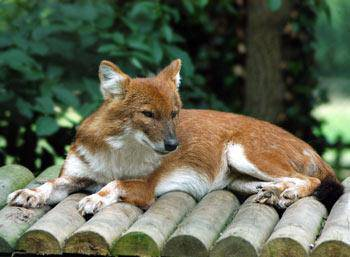

In [136]:
image

In [137]:
# creating the function

In [138]:
image = tf.io.read_file('/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg')

In [139]:
image = tf.image.decode_jpeg(image, channels=3)
image

<tf.Tensor: shape=(332, 500, 3), dtype=uint8, numpy=
array([[[  4,   6,   0],
        [  5,   7,   0],
        [  6,   8,   0],
        ...,
        [ 88,  99,  39],
        [ 86,  97,  37],
        [ 85,  96,  36]],

       [[  6,   8,   0],
        [  6,   8,   0],
        [  7,   9,   0],
        ...,
        [ 91, 103,  41],
        [ 90, 102,  40],
        [ 88, 100,  38]],

       [[  8,  10,   0],
        [  8,  10,   0],
        [  8,  10,   0],
        ...,
        [ 89,  99,  36],
        [ 88,  98,  35],
        [ 87,  97,  34]],

       ...,

       [[ 79,  91,  55],
        [ 58,  72,  36],
        [ 57,  71,  35],
        ...,
        [ 92, 109,  57],
        [ 93, 110,  58],
        [ 93, 110,  58]],

       [[ 83,  93,  56],
        [ 61,  73,  35],
        [ 79,  91,  53],
        ...,
        [ 94, 111,  59],
        [ 94, 111,  59],
        [ 94, 111,  59]],

       [[ 75,  86,  46],
        [ 54,  65,  25],
        [ 94, 106,  68],
        ...,
        [ 95, 112,  6

In [140]:
image = tf.image.convert_image_dtype(image, tf.float32)
image

<tf.Tensor: shape=(332, 500, 3), dtype=float32, numpy=
array([[[0.01568628, 0.02352941, 0.        ],
        [0.01960784, 0.02745098, 0.        ],
        [0.02352941, 0.03137255, 0.        ],
        ...,
        [0.34509805, 0.38823533, 0.15294118],
        [0.3372549 , 0.3803922 , 0.14509805],
        [0.33333334, 0.37647063, 0.14117648]],

       [[0.02352941, 0.03137255, 0.        ],
        [0.02352941, 0.03137255, 0.        ],
        [0.02745098, 0.03529412, 0.        ],
        ...,
        [0.35686275, 0.4039216 , 0.16078432],
        [0.3529412 , 0.40000004, 0.15686275],
        [0.34509805, 0.3921569 , 0.14901961]],

       [[0.03137255, 0.03921569, 0.        ],
        [0.03137255, 0.03921569, 0.        ],
        [0.03137255, 0.03921569, 0.        ],
        ...,
        [0.34901962, 0.38823533, 0.14117648],
        [0.34509805, 0.38431376, 0.13725491],
        [0.34117648, 0.3803922 , 0.13333334]],

       ...,

       [[0.30980393, 0.35686275, 0.21568629],
        [0.22

In [141]:
img_size = 224
image = tf.image.resize(image, size=[img_size,img_size])
image

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[1.94105785e-02, 2.72537153e-02, 0.00000000e+00],
        [2.78011225e-02, 3.56442593e-02, 0.00000000e+00],
        [3.85854356e-02, 4.64285761e-02, 3.29131843e-03],
        ...,
        [3.32639068e-01, 4.02836263e-01, 7.00689256e-02],
        [3.54586780e-01, 4.01995718e-01, 1.44051179e-01],
        [3.39167804e-01, 3.83250475e-01, 1.46065548e-01]],

       [[2.92016808e-02, 3.70448194e-02, 0.00000000e+00],
        [3.12077980e-02, 3.90509330e-02, 0.00000000e+00],
        [3.25452089e-02, 4.03883457e-02, 8.72228775e-05],
        ...,
        [3.45606714e-01, 4.15564746e-01, 9.46612209e-02],
        [3.53031844e-01, 4.02555972e-01, 1.33298457e-01],
        [3.45346540e-01, 3.86733115e-01, 1.40759677e-01]],

       [[2.66456604e-02, 3.36834751e-02, 0.00000000e+00],
        [2.25140080e-02, 2.95518227e-02, 0.00000000e+00],
        [1.79324858e-02, 2.49703024e-02, 0.00000000e+00],
        ...,
        [3.15166384e-01, 3.80712

In [142]:
img_size = 224

def process_image(image_path):
  image = tf.io.read_file(image_path) # Reading the image in the path
  image = tf.image.decode_jpeg(image,channels=3) #Decoding the 3 channels in the jpeg image
  image = tf.image.convert_image_dtype(image, tf.float32) #Converting image into float datatype and changing its value between 0to1
  image = tf.image.resize(image, size=[img_size,img_size]) #Resizing the image
  return image

# Turning our data into batches for better processing(the best batch size is 32)

* we use batch wise processing because when we have huge amount of data They cannot fit into our memory and may cause slow down
* so we use this batch size data processing for effecient performance of the cpu or gpu we use
* To use Tensorflow effectively we need data in the form of tensor couple `(images, labels)`

In [143]:
def get_image_label(image_path,label):
  image = process_image(image_path)
  return image, label # The X and Y of the data


In [144]:
# The above function returns output like this

(process_image(x[40]),y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.99609005, 0.96119833, 0.95770377],
         [0.98501533, 0.94666374, 0.93379605],
         [0.99749774, 0.9770274 , 0.9565523 ],
         ...,
         [0.34569168, 0.5497533 , 0.22850783],
         [0.4276134 , 0.6322353 , 0.33483163],
         [0.36833197, 0.5772412 , 0.29097825]],
 
        [[0.9687435 , 0.965289  , 0.9172323 ],
         [0.94134724, 0.93233955, 0.8760108 ],
         [0.92182285, 0.9180851 , 0.8512452 ],
         ...,
         [0.36644298, 0.57037514, 0.24943131],
         [0.36225268, 0.5662274 , 0.2703323 ],
         [0.34930357, 0.5534058 , 0.27435333]],
 
        [[0.82989013, 0.87487435, 0.75133675],
         [0.7506709 , 0.7958162 , 0.66784185],
         [0.75523835, 0.8078179 , 0.67545015],
         ...,
         [0.40426058, 0.60512996, 0.2932135 ],
         [0.35947898, 0.55773896, 0.2682605 ],
         [0.38644102, 0.5856088 , 0.3115852 ]],
 
        ...,
 
        [[0.45484307, 0.5300532 

# Creating a function to turn data into batches

In [145]:
t = tf.data.Dataset.from_tensor_slices((tf.constant(image)))


In [146]:
t

<_TensorSliceDataset element_spec=TensorSpec(shape=(224, 3), dtype=tf.float32, name=None)>

In [147]:
batch_size = 32

def create_data_batches(x, y=None, batch_size = 32, valid_data = False, test_data = False):
  """
  we have three types of data 1.Train data, 2.Valid data, 3.Test data
  for training and test data we will have labels by default but in test data we dont have labels
  """
  if test_data:
    print('creating test data batches')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_image).batch(batch_size)
    print('Completed')
    return data_batch

  elif valid_data:
    print('Creating Validation batches')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data_batch = data.map(get_image_label).batch(batch_size)
    print('completed')

    return data_batch

  else:
    print('Creating Training Batches')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data = data.shuffle(buffer_size = len(x))
    data_batch = data.map(get_image_label).batch(batch_size)
    print('Completed')
    return data_batch

In [148]:
train_data = create_data_batches(x = xtrain,y = ytrain)
val_data = create_data_batches(x = xval,y = yval, valid_data=True)

Creating Training Batches
Completed
Creating Validation batches
completed


In [149]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing Data batches

In [150]:
import matplotlib.pyplot as plt

def show_25_images(images,labels):
    plt.figure(figsize=(10,10))
    for i in range(25):
        ax = plt.subplot(5,5,i+1)
        plt.imshow(images[i])
        plt.title(unique_breeds[labels[i].argmax()])
        plt.axis('off')

In [151]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.6509804 , 0.7686275 , 0.86274517],
          [0.65470135, 0.77234846, 0.8664661 ],
          [0.65882355, 0.77647066, 0.8705883 ],
          ...,
          [0.60784316, 0.7607844 , 0.89019614],
          [0.61819863, 0.7458246 , 0.87583166],
          [0.6248512 , 0.7424983 , 0.87583166]],
 
         [[0.6470151 , 0.7646622 , 0.85877985],
          [0.65034807, 0.7679952 , 0.8621128 ],
          [0.65485823, 0.77250534, 0.866623  ],
          ...,
          [0.61564255, 0.75681907, 0.8901524 ],
          [0.6234923 , 0.75294125, 0.89019614],
          [0.62352943, 0.75294125, 0.89019614]],
 
         [[0.64044994, 0.75809705, 0.8522147 ],
          [0.6443715 , 0.7620186 , 0.85613626],
          [0.6482931 , 0.7659402 , 0.86005783],
          ...,
          [0.61445206, 0.75294125, 0.8808999 ],
          [0.6144206 , 0.7475666 , 0.88563734],
          [0.6154674 , 0.7475666 , 0.89019614]],
 
         ...,
 
         [[0.3851342 , 0.38121262, 0.30278125],
          [0.40828

In [152]:
len(train_images),len(train_labels)

(32, 32)

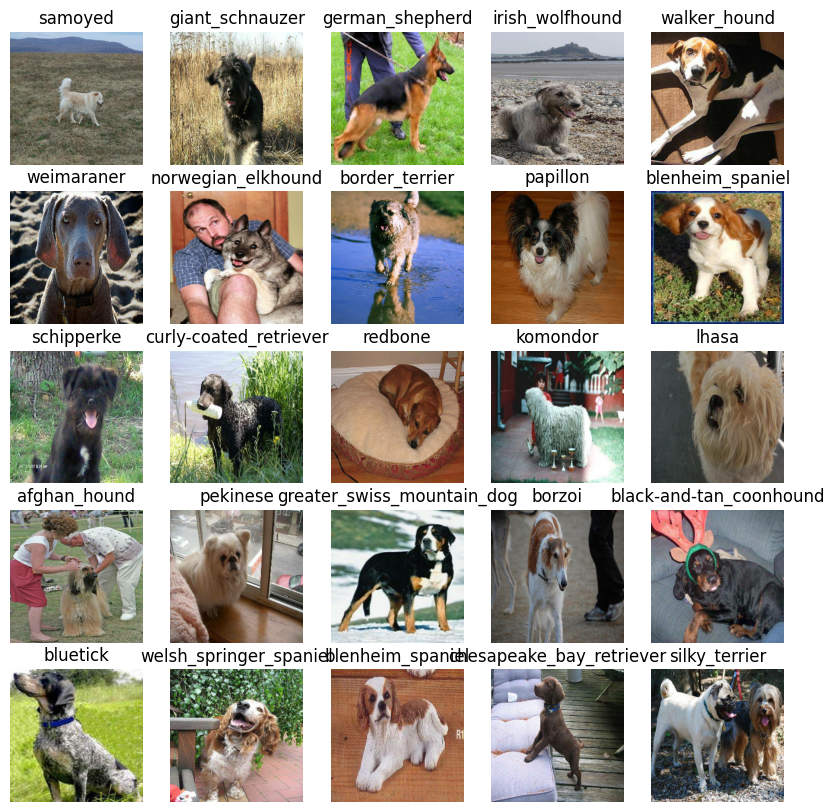

In [153]:
show_25_images(train_images,train_labels)

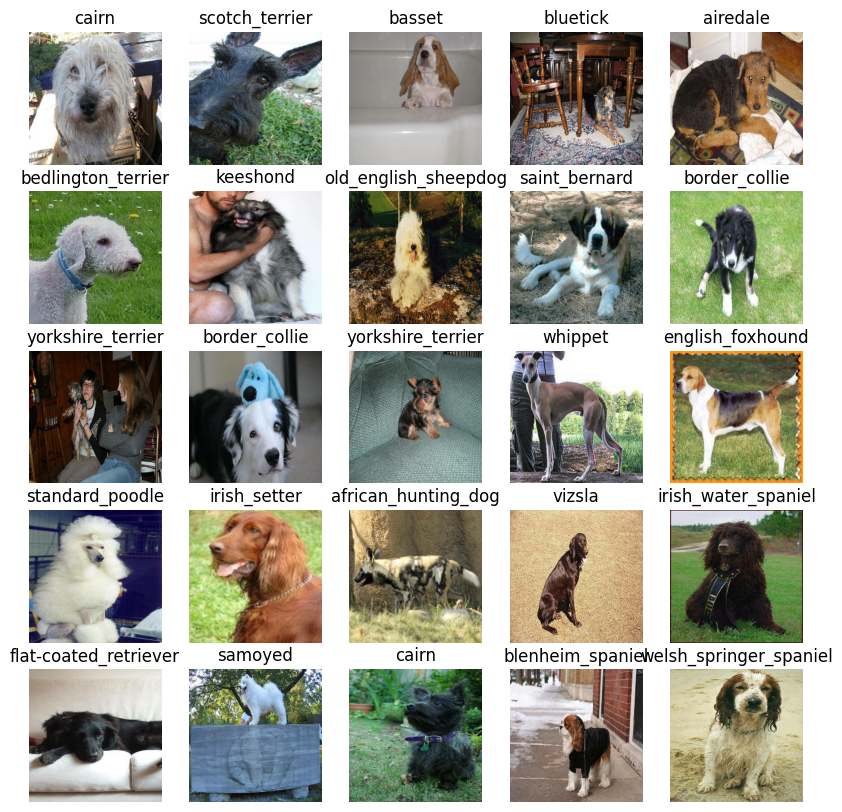

In [154]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

# Builiding a Model

In [155]:
train_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [156]:
val_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [157]:
input_shape = [None, 224, 224, 3] # batch, height, width, colour channel
output_shape = len(unique_breeds)
# setup model url from tensorflow hub
model_url = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

# create a function to
    1.takes inputshape, output shape, model url as parameters
    2.defines the layers in the keras model in a sequential method
    3.compiles the model (should be evaluated and improved)
    4.Builds the mdel
    5.returns the model
all these can be refered in keras documentation

In [158]:
import tensorflow.keras as tfk
# a function for model creation
def create_model(input_shape=input_shape, output_shape=output_shape, model_url=model_url):
    print('create a model with: ', model_url)

    # setup the model
    model = tfk.Sequential([
        hub.KerasLayer(model_url),
                       tfk.layers.Dense(units=output_shape, activation='softmax')
                       ])

    # compile the model
    model.compile(
        loss=tfk.losses.CategoricalCrossentropy(),
        optimizer=tfk.optimizers.Adam(),
        metrics=['accuracy']
    )

    # build the model
    model.build(input_shape)

    return model

In [159]:
model = create_model()
model.summary()

create a model with:  https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_3 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_3 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress or stop training early if a model stops improving

we'll create two callbacks one for tensorboard which helps in tracking the models process and another for early stopping which prevents our model from training too long

## Tensorboard Callback

To setup a tensorbord callback we need to
  1. load tensorboard extension
  2. create a tensorboard callback which is able to save logs to a directory and pass it to our model's fit function
  3. visualize our models training logs with the `%tensorboard` magic function (after model training)

In [160]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [161]:
import datetime

# create a function to build a Tensorboard callback

def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/MyDrive/Dog Vision/logs",
                        #get the time of every entry whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early stopping CallBack

Early stopping helps our data from getting overfitting by stopping training if a certain evaluation metric stops improving.

In [162]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",patience=3)

# Training a Model

our first model is going to be trained on a subset of 1000 images,to make sure everything is okey

In [163]:
num_epoch = 100 #@param {type: "slider", min:10, max:100, step:10}

### Creating a function to train the model
* create a model using `create_model()` function
* setup tensorboard callback using `create_tensorboard_callback()`
* call the `fit()` function on our model passing it to the training data, validation data, number of epoch to train for (`NUM_EPOCHS`) and the callbacks we like to use
* return the function

In [164]:
def train_model():
  model = create_model()
  tensorboard = create_tensorboard_callback()

  # training the model
  model.fit(x=train_data,
            epochs=num_epoch,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  return model

In [165]:
model = train_model()

create a model with:  https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
25/25 [==============================] - 123s 3s/step - loss: 4.5457 - accuracy: 0.1013 - val_loss: 3.3990 - val_accuracy: 0.2850
Epoch 2/100
25/25 [==============================] - 5s 191ms/step - loss: 1.6109 - accuracy: 0.6888 - val_loss: 2.1221 - val_accuracy: 0.5400
Epoch 3/100
25/25 [==============================] - 4s 151ms/step - loss: 0.5546 - accuracy: 0.9413 - val_loss: 1.6689 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 4s 162ms/step - loss: 0.2490 - accuracy: 0.9925 - val_loss: 1.4987 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 4s 165ms/step - loss: 0.1479 - accuracy: 0.9962 - val_loss: 1.3995 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 5s 208ms/step - loss: 0.1006 - accuracy: 0.9987 - val_loss: 1.3720 - val_accuracy: 0.6450
Epoch 7/100
25/25 [===================

It looks like our model is overfitting because its performing well on the training dataset than the validation dataset.

In [166]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

Output hidden; open in https://colab.research.google.com to view.

# Making and evaluating predictions using the trained model

In [167]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [168]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 106ms/step


array([[2.4040564e-04, 9.1265487e-05, 7.1821123e-04, ..., 1.9234588e-04,
        9.9516355e-06, 2.0731101e-03],
       [1.6288308e-03, 4.7367267e-04, 7.8698145e-03, ..., 1.2814214e-03,
        4.1157263e-04, 2.1189581e-04],
       [6.8909983e-05, 1.7261597e-04, 5.3762645e-04, ..., 2.5552014e-04,
        1.4514031e-04, 7.7767950e-04],
       ...,
       [1.2196445e-05, 3.3557455e-05, 1.6031091e-04, ..., 2.8851055e-05,
        5.0052733e-04, 2.8032114e-04],
       [1.1143636e-02, 2.7944744e-04, 1.5097200e-04, ..., 3.2437220e-04,
        6.2697683e-05, 3.2134995e-02],
       [8.4589221e-05, 1.0984562e-05, 2.3122441e-03, ..., 1.3431705e-03,
        1.2240604e-03, 6.3115709e-05]], dtype=float32)

In [169]:
predictions.shape

(200, 120)

In [170]:
len(yval)

200

In [171]:
predictions[0]

array([2.40405643e-04, 9.12654868e-05, 7.18211231e-04, 2.05727803e-04,
       1.29750842e-04, 2.91428405e-05, 6.16013026e-03, 2.27989070e-03,
       2.25809621e-04, 1.13498687e-03, 5.34818682e-04, 9.81247431e-05,
       5.53786347e-04, 1.08453234e-04, 1.15904538e-03, 5.50701690e-04,
       8.88913710e-05, 1.98274910e-01, 5.51132416e-06, 2.04947919e-05,
       4.02783771e-04, 1.64485420e-04, 5.35692343e-05, 1.63983076e-03,
       1.10057641e-04, 5.54165854e-05, 3.24701667e-01, 6.09325580e-05,
       1.02740727e-04, 3.00164334e-04, 5.83318651e-05, 1.65141409e-03,
       1.61513046e-04, 4.16689036e-05, 7.93728686e-05, 3.94419208e-02,
       1.54095891e-04, 6.95890194e-05, 1.77179318e-04, 3.23142536e-04,
       9.97431460e-04, 2.64941482e-05, 4.85942182e-05, 3.71306414e-05,
       1.15012863e-05, 1.57970702e-04, 2.79424621e-05, 1.56320923e-04,
       7.53600150e-04, 1.75593479e-04, 1.00626305e-04, 9.09978044e-05,
       1.41810603e-03, 1.47967599e-04, 8.84614201e-05, 2.26175780e-05,
      

In [172]:
index = 0
print(predictions[index])
print(f"max value of probability is {np.max(predictions[index])}")
print(f"sum:{np.sum(predictions[index])}")
print(f"max index:{np.argmax(predictions[index])}")
print(f"predicted label:{unique_breeds[np.argmax(predictions[index])]}")

[2.40405643e-04 9.12654868e-05 7.18211231e-04 2.05727803e-04
 1.29750842e-04 2.91428405e-05 6.16013026e-03 2.27989070e-03
 2.25809621e-04 1.13498687e-03 5.34818682e-04 9.81247431e-05
 5.53786347e-04 1.08453234e-04 1.15904538e-03 5.50701690e-04
 8.88913710e-05 1.98274910e-01 5.51132416e-06 2.04947919e-05
 4.02783771e-04 1.64485420e-04 5.35692343e-05 1.63983076e-03
 1.10057641e-04 5.54165854e-05 3.24701667e-01 6.09325580e-05
 1.02740727e-04 3.00164334e-04 5.83318651e-05 1.65141409e-03
 1.61513046e-04 4.16689036e-05 7.93728686e-05 3.94419208e-02
 1.54095891e-04 6.95890194e-05 1.77179318e-04 3.23142536e-04
 9.97431460e-04 2.64941482e-05 4.85942182e-05 3.71306414e-05
 1.15012863e-05 1.57970702e-04 2.79424621e-05 1.56320923e-04
 7.53600150e-04 1.75593479e-04 1.00626305e-04 9.09978044e-05
 1.41810603e-03 1.47967599e-04 8.84614201e-05 2.26175780e-05
 4.17592702e-04 2.18694122e-03 5.07389894e-04 8.79678503e-02
 3.74164010e-05 8.81050291e-05 4.18462791e-04 4.84621851e-05
 9.68999229e-05 1.960918

# turning prediction probabilities into their respective label

In [173]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]


In [174]:
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

**since our validation sets in the form of batches we have to unbatch them to make predictions on the validation set and compare them to the true values**

In [175]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [176]:
 def unbatchify(data):
  images = []
  labels = []

  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [177]:
val_images, val_labels = unbatchify(val_data)

In [178]:
def plot_pred(prediction_probabilities, labels, images, n=1):

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'
  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,true_label),color = color)


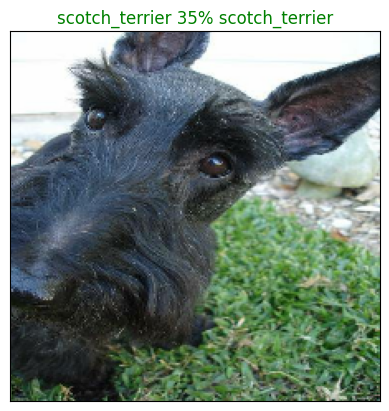

In [179]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images= val_images)

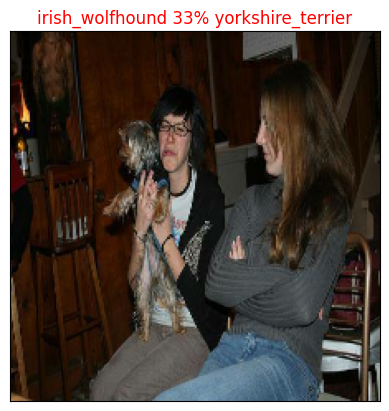

In [180]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images= val_images,n=10)

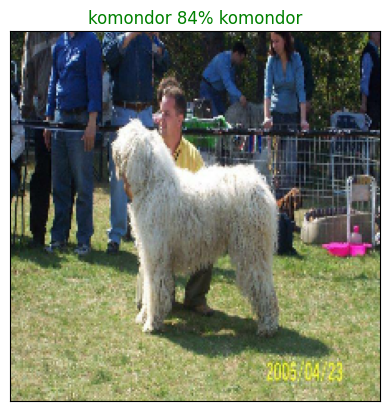

In [181]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images= val_images,n=26)

## creating a function to visualize our model's top 10 predictions

In [182]:
predictions[0].argsort()[-10:][::-1]

array([ 26,  17,  70,  59, 103,  35,  73, 109,  65,  68])

In [183]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.32470167, 0.19827491, 0.09239239, 0.08796785, 0.0605542 ,
       0.03944192, 0.03073947, 0.02045648, 0.01960919, 0.01827204],
      dtype=float32)

In [184]:
def plot_pred_label(prediction_probabilities,labels,n=1):
  pred_prob, true_label = prediction_probabilities[n],labels[n]
  pred_label = get_pred_label(pred_prob)
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = 'vertical')

  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

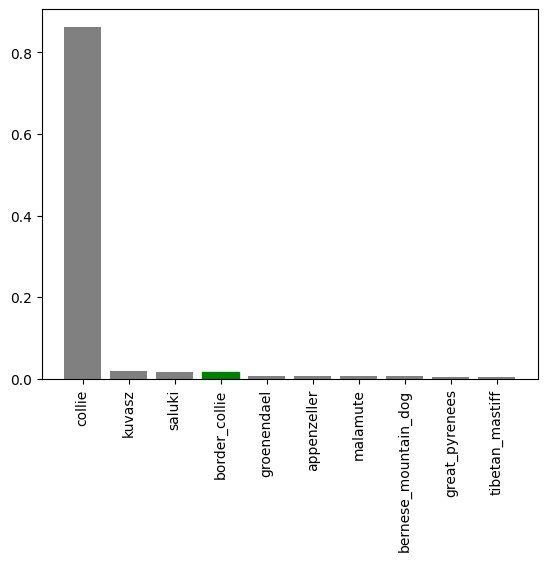

In [185]:
plot_pred_label(predictions,val_labels,n=9)

## plotting with the real image and its predictions

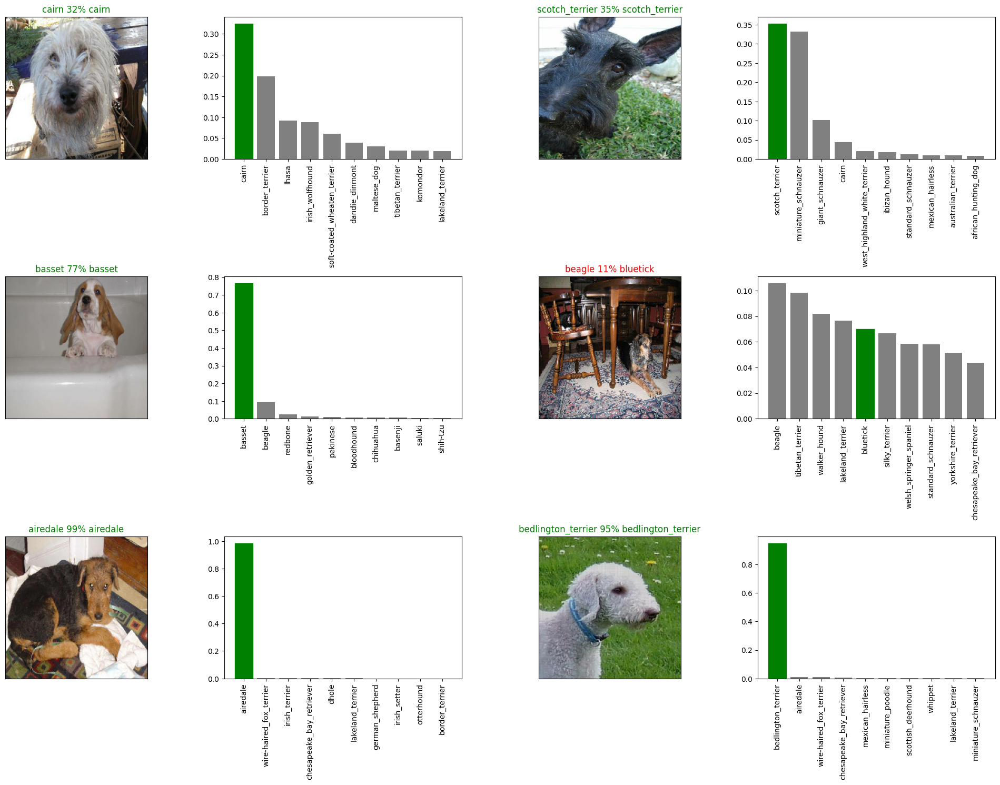

In [186]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
           labels = val_labels,
           images = val_images,
           n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_label(prediction_probabilities=predictions,
                 labels = val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# Saving and loading the model

In [187]:
def save_model(model,suffix=None):
  modeldir = os.path.join('drive/MyDrive/Dog Vision/models',datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  modelpath = modeldir+'-'+suffix+'.h5'
  print(f'saving model to {modelpath}')
  model.save(modelpath)
  return modelpath


In [188]:
save_model(model,'Dog_classifier_1')

saving model to drive/MyDrive/Dog Vision/models/20240528-144423-Dog_classifier_1.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20240528-144423-Dog_classifier_1.h5'

In [189]:
def load_model(model_path):
  print(f'loading the model from {model_path}')
  model = tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
  return model


In [190]:
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/20240526-110903-Dog_classifier_1.h5")

loading the model from drive/MyDrive/Dog Vision/models/20240526-110903-Dog_classifier_1.h5


In [191]:
loaded_1000_image_model

In [192]:
model.evaluate(val_data)

7/7 [==============================] - 1s 106ms/step - loss: 1.3187 - accuracy: 0.6500


[1.3186553716659546, 0.6499999761581421]

In [193]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 151ms/step - loss: 1.2221 - accuracy: 0.6550


[1.22206711769104, 0.6549999713897705]

# Training the Model on the full data

In [194]:
len(x),len(y)

(10222, 10222)

In [195]:
full_data = create_data_batches(x,y)

Creating Training Batches
Completed


In [196]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [197]:
full_model = create_model()

create a model with:  https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [198]:
full_model_tensorboard_callback = create_tensorboard_callback()

In [199]:
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',patience=3)

In [200]:
full_model.fit(x=full_data,
               epochs=num_epoch,
               callbacks=[full_model_tensorboard_callback,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 45s 127ms/step - loss: 1.3509 - accuracy: 0.6718
Epoch 2/100
320/320 [==============================] - 41s 128ms/step - loss: 0.3969 - accuracy: 0.8814
Epoch 3/100
320/320 [==============================] - 41s 127ms/step - loss: 0.2348 - accuracy: 0.9368
Epoch 4/100
320/320 [==============================] - 42s 130ms/step - loss: 0.1533 - accuracy: 0.9650
Epoch 5/100
320/320 [==============================] - 41s 128ms/step - loss: 0.1061 - accuracy: 0.9783
Epoch 6/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0778 - accuracy: 0.9867
Epoch 7/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0591 - accuracy: 0.9903
Epoch 8/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0463 - accuracy: 0.9946
Epoch 9/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0370 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 41s 129m

# Saving the Model

In [202]:
save_model(full_model,  suffix = 'full_image_trained_model')

saving model to drive/MyDrive/Dog Vision/models/20240528-151053-full_image_trained_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20240528-151053-full_image_trained_model.h5'

In [203]:
loaded_full_model = load_model('drive/MyDrive/Dog Vision/models/20240528-151053-full_image_trained_model.h5')

loading the model from drive/MyDrive/Dog Vision/models/20240528-151053-full_image_trained_model.h5


In [204]:
loaded_full_model

# Making predictions using Test Data

In [206]:
test_path = '/content/drive/MyDrive/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/85b2bef1d9eb9a849cba5c72273b54c4.jpg',
 '/content/drive/MyDrive/Dog Vision/test/85af7b2d042d0572baa01d428a65a35f.jpg',
 '/content/drive/MyDrive/Dog Vision/test/85b972b3a6680872d1431210dc7dc19d.jpg',
 '/content/drive/MyDrive/Dog Vision/test/85bb38d45f1efff6bc45453df671710a.jpg',
 '/content/drive/MyDrive/Dog Vision/test/85c13ab8a324ac101734de1251d4a551.jpg',
 '/content/drive/MyDrive/Dog Vision/test/85c78df191958f1751aa118e6d3021aa.jpg',
 '/content/drive/MyDrive/Dog Vision/test/85c9d2802ea11ac1baa5f941f60f046b.jpg',
 '/content/drive/MyDrive/Dog Vision/test/85cc17a7822c05deb8e78bd391e37ad6.jpg',
 '/content/drive/MyDrive/Dog Vision/test/85d952743882c67440266ed2e48d0e13.jpg',
 '/content/drive/MyDrive/Dog Vision/test/85d9efa867aae45a6a8583c942945ffd.jpg']

In [207]:
len(test_filenames)

10357

In [208]:
test_data = create_data_batches(test_filenames, test_data=True)

creating test data batches
Completed


In [209]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [221]:
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 171s 528ms/step


In [228]:
#saving predictions to a numpy array
np.savetxt(fname="/content/drive/MyDrive/Dog Vision/pred_array.csv",X=test_predictions,delimiter=',')

In [229]:
test_preds = np.loadtxt("/content/drive/MyDrive/Dog Vision/pred_array.csv",delimiter = ',')

In [224]:
# creating the prediction Dataframe
import pandas as pd

preds_df = pd.DataFrame(columns= ['id']+list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [225]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [226]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,85b2bef1d9eb9a849cba5c72273b54c4,4.723685e-09,4.538013e-07,5.140003e-10,7.567874e-09,6.252188e-09,8.508003e-11,1.856346e-06,1.437254e-08,1.478201e-06,...,1.030991e-07,6.053682e-09,6.031605e-11,1.805186e-09,2.763186e-08,3.389518e-09,2.312870e-06,3.237727e-07,1.475708e-07,1.652424e-08
1,85af7b2d042d0572baa01d428a65a35f,1.518148e-06,1.368855e-07,9.793175e-10,9.844701e-09,1.250234e-06,8.364736e-09,1.792514e-10,1.953143e-07,1.019763e-07,...,5.119968e-08,1.515331e-09,2.765709e-09,2.160642e-07,6.674545e-10,1.026052e-06,1.044129e-05,6.798518e-07,3.489330e-05,1.864184e-08
2,85b972b3a6680872d1431210dc7dc19d,3.549078e-09,9.086584e-09,1.383223e-08,1.071070e-07,8.096301e-07,7.182928e-01,2.897303e-09,3.774844e-07,1.602190e-06,...,2.621018e-08,1.015996e-10,1.658355e-08,1.013487e-06,3.983835e-08,8.275817e-06,5.325219e-08,1.244050e-04,8.786959e-11,4.240297e-10
3,85bb38d45f1efff6bc45453df671710a,7.855078e-08,3.119691e-09,5.972498e-09,8.349281e-06,5.113176e-10,8.992289e-10,8.120232e-04,8.053308e-09,2.096179e-10,...,1.935731e-09,8.858966e-08,5.097302e-07,9.954510e-09,2.850443e-09,4.371999e-09,6.042309e-10,7.693496e-07,1.895953e-09,7.490549e-05
4,85c13ab8a324ac101734de1251d4a551,2.237120e-13,2.181998e-06,1.678677e-12,4.071583e-13,1.199110e-13,3.594668e-13,7.245822e-13,1.937113e-15,1.020262e-09,...,9.915681e-16,2.370668e-15,1.339748e-12,5.126833e-08,7.723102e-10,8.568924e-09,1.785835e-12,1.944390e-08,1.206293e-12,1.810052e-13


In [227]:
preds_df.shape

(10357, 121)

In [231]:
preds_df.to_csv('drive/MyDrive/Dog Vision/Full_Model_Predictions.csv',index=False)